In [1]:

# Sqlite is a library that implements a SQL database engine. 
import sqlite3
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
#                  Import volume index (2000 = 100)


In [3]:
#connection
conn = sqlite3.connect('../input/world-development-indicators/database.sqlite')

In [4]:
#sqlite_master is a table with database schema
pd.read_sql(""" SELECT *
                FROM sqlite_master
                WHERE type='table';""",
           conn)

,type,name,tbl_name,rootpage,sql
0,table,Country,Country,2,"CREATE TABLE Country (\n CountryCode TEXT,\..."
1,table,CountryNotes,CountryNotes,186,CREATE TABLE CountryNotes (\n Countrycode T...
2,table,Series,Series,948,"CREATE TABLE Series (\n SeriesCode TEXT,\n ..."
3,table,Indicators,Indicators,4448,CREATE TABLE Indicators (\n CountryName TEX...
4,table,SeriesNotes,SeriesNotes,1317550,CREATE TABLE SeriesNotes (\n Seriescode TEX...
5,table,Footnotes,Footnotes,1317587,CREATE TABLE Footnotes (\n Countrycode TEXT...


In [5]:
# check the head
pd.read_sql("""SELECT *
               FROM Indicators
               LIMIT 3;""",
           conn)

,CountryName,CountryCode,IndicatorName,IndicatorCode,Year,Value
0,Arab World,ARB,"Adolescent fertility rate (births per 1,000 wo...",SP.ADO.TFRT,1960,133.560907
1,Arab World,ARB,Age dependency ratio (% of working-age populat...,SP.POP.DPND,1960,87.797601
2,Arab World,ARB,"Age dependency ratio, old (% of working-age po...",SP.POP.DPND.OL,1960,6.634579


In [6]:
# how many rows?
pd.read_sql("""SELECT COUNT(*)
               FROM Indicators;""",
           conn)

,COUNT(*)
0,5656458


In [7]:
#Number of countries / indicators / years
pd.read_sql("""SELECT COUNT (DISTINCT CountryName) AS Number_of_countries ,
                COUNT (DISTINCT IndicatorName) AS Number_of_Indicators,
                COUNT (DISTINCT Year) AS Number_of_years
               FROM Indicators;""",
           conn)

,Number_of_countries,Number_of_Indicators,Number_of_years
0,247,1344,56


In [8]:
countries=pd.read_sql("""SELECT DISTINCT CountryName 
                FROM Indicators;""",
           conn)
#for country in countries['CountryName'] :print(country)
countries

,CountryName
0,Afghanistan
1,Albania
2,Algeria
3,American Samoa
4,Andorra
...,...
242,West Bank and Gaza
243,World
244,"Yemen, Rep."
245,Zambia


In [9]:
indicators=pd.read_sql("""SELECT DISTINCT IndicatorName 
                FROM Indicators;""",
           conn)
for indicator in indicators['IndicatorName'] :print(indicator)


2005 PPP conversion factor, GDP (LCU per international $)
2005 PPP conversion factor, private consumption (LCU per international $)
ARI treatment (% of children under 5 taken to a health provider)
Access to electricity (% of population)
Access to electricity, rural (% of rural population)
Access to electricity, urban (% of urban population)
Access to non-solid fuel (% of population)
Access to non-solid fuel, rural (% of rural population)
Access to non-solid fuel, urban (% of urban population)
Adequacy of social insurance programs (% of total welfare of beneficiary households)
Adequacy of social protection and labor programs (% of total welfare of beneficiary households)
Adequacy of social safety net programs (% of total welfare of beneficiary households)
Adequacy of unemployment benefits and ALMP (% of total welfare of beneficiary households)
Adjusted net enrolment rate, primary, both sexes (%)
Adjusted net enrolment rate, primary, female (%)
Adjusted net enrolment rate, primary, male 

In [10]:
years=pd.read_sql("""SELECT DISTINCT Year 
                FROM Indicators;""",
           conn)
#for year in years['Year'] :print(year)
years

,Year
0,1960
1,1961
2,1962
3,1963
4,1964
5,1965
6,1966
7,1967
8,1968
9,1969


In [11]:
# checking for missing values in all columns
pd.read_sql("""SELECT COUNT(*) - COUNT(CountryName) AS missing_CountryName,
                      COUNT(*) - COUNT(CountryCode) AS missing_CountryCode,
                      COUNT(*) - COUNT(IndicatorName) AS missing_IndicatorName,
                      COUNT(*) - COUNT(IndicatorCode) AS missing_IndicatorCode, 
                      COUNT(*) - COUNT(Year) AS missing_Year, 
                      COUNT(*) - COUNT(Value) AS missing_Value
                FROM Indicators;""",
           conn)

,missing_CountryName,missing_CountryCode,missing_IndicatorName,missing_IndicatorCode,missing_Year,missing_Value
0,0,0,0,0,0,0


In [12]:
# Selecting the GDP per capita for Algeria
algeria_gdp_over_years=pd.read_sql(""" SELECT Year,Value AS 'Algeria GDP'
                FROM Indicators
                WHERE IndicatorName ='GDP per capita (current US$)'
                AND CountryName = "Algeria" """,
           conn)
algeria_gdp_over_years

,Year,Algeria GDP
0,1960,244.823735
1,1961,213.485048
2,1962,171.209137
3,1963,225.529803
4,1964,236.609182
5,1965,248.380142
6,1966,234.190775
7,1967,252.420303
8,1968,280.270647
9,1969,300.984293


In [13]:
import pandas as pd
import sqlite3

# Assuming you have a SQLite connection named 'conn' established
# Fetch GDP per capita data for Algeria
algeria_gdp_over_years = pd.read_sql("""
    SELECT Year, Value AS 'Algeria GDP'
    FROM Indicators
    WHERE IndicatorName = 'GDP per capita (current US$)'
    AND CountryName = "Algeria"
""", conn)

# Fetch data for other economic indicators for Algeria
algeria_indicators = pd.read_sql("""
    SELECT Year, IndicatorName, Value
    FROM Indicators
    WHERE CountryName = "Algeria"
    AND IndicatorName <> 'GDP per capita (current US$)'
""", conn)

# Merge the GDP per capita and other economic indicators data based on the 'Year' column
algeria_combined_data = pd.merge(algeria_gdp_over_years, algeria_indicators, on='Year')

correlations = {}

for indicator_name in algeria_combined_data['IndicatorName'].unique():
    data = algeria_combined_data[algeria_combined_data['IndicatorName'] == indicator_name]
    correlation = data['Value'].corr(data['Algeria GDP'])
    correlations[indicator_name] = correlation

# Sort the correlations in descending order
correlations_sorted = sorted(correlations.items(), key=lambda x: x[1], reverse=True)

# Print the top 10 correlated indicators
top_10_correlations = correlations_sorted[:20]
print(top_10_correlations)

/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)


[('Adjusted savings: consumption of fixed capital (current US$)', 0.9864017056192159), ('Adjusted net national income per capita (current US$)', 0.9862748305848831), ('GDP at market prices (current US$)', 0.9779626900074042), ('GNI (current US$)', 0.9772585470701105), ('Gross national expenditure (current US$)', 0.9737015280994723), ('Final consumption expenditure (current US$)', 0.9735703929375884), ('Final consumption expenditure, etc. (current US$)', 0.9735699365534364), ('Adjusted savings: education expenditure (current US$)', 0.9723380275164029), ('Household final consumption expenditure (current US$)', 0.9723294983472266), ('Household final consumption expenditure, etc. (current US$)', 0.9723259988450039), ('Industry, value added (current US$)', 0.9694864291248712), ('Gross national expenditure (constant 2005 US$)', 0.9690816472463822), ('Gross national expenditure (constant LCU)', 0.9666180022947531), ('Final consumption expenditure (constant LCU)', 0.9639489123194166), ('Final 

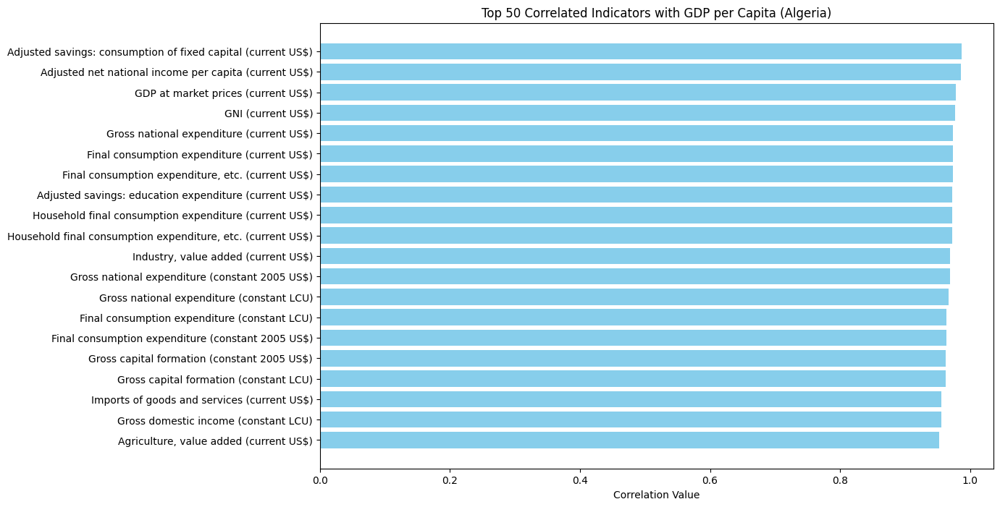

In [14]:
import matplotlib.pyplot as plt

# Assuming you have the top 50 correlated indicators in a list of tuples as 'top_10_correlations'

# Extract the indicator names and correlation values
indicators, correlation_values = zip(*top_10_correlations)

# Create a bar chart
plt.figure(figsize=(12, 8))
plt.barh(indicators, correlation_values, color='skyblue')
plt.xlabel('Correlation Value')
plt.title('Top 50 Correlated Indicators with GDP per Capita (Algeria)')
plt.gca().invert_yaxis()  # Invert the y-axis for better readability
plt.show()


In [15]:
# Selecting all indicators for Algeria
algeria_indicators = pd.read_sql("""
    SELECT Year, IndicatorName, Value
    FROM Indicators
    WHERE CountryName = "Algeria"
""", conn)

#algeria_indicators = algeria_indicators.set_index("IndicatorName")
algeria_indicators.reset_index(drop=True)

,Year,IndicatorName,Value
0,1960,"Adolescent fertility rate (births per 1,000 wo...",1.238892e+02
1,1960,Age dependency ratio (% of working-age populat...,9.142517e+01
2,1960,"Age dependency ratio, old (% of working-age po...",6.166136e+00
3,1960,"Age dependency ratio, young (% of working-age ...",8.525903e+01
4,1960,"Agriculture, value added (constant 2005 US$)",1.915338e+09
...,...,...,...
34573,2015,Time required to register property (days),5.500000e+01
34574,2015,Time required to start a business (days),2.000000e+01
34575,2015,Time to prepare and pay taxes (hours),3.850000e+02
34576,2015,Time to resolve insolvency (years),1.300000e+00


In [16]:
''''import matplotlib.pyplot as plt
import seaborn as sns

# Pivot the data to have IndicatorName as columns and Year as the index
covariance_data = algeria_indicators.pivot(index='Year', columns='IndicatorName', values='Value')

# Calculate the covariance matrix
cov_matrix = covariance_data.cov()

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Create a heatmap using seaborn
sns.heatmap(cov_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)

# Set the title
plt.title("Covariance Matrix of Indicators")

# Show the plot
plt.show()'''

'\'import matplotlib.pyplot as plt\nimport seaborn as sns\n\n# Pivot the data to have IndicatorName as columns and Year as the index\ncovariance_data = algeria_indicators.pivot(index=\'Year\', columns=\'IndicatorName\', values=\'Value\')\n\n# Calculate the covariance matrix\ncov_matrix = covariance_data.cov()\n\n# Set up the matplotlib figure\nplt.figure(figsize=(12, 8))\n\n# Create a heatmap using seaborn\nsns.heatmap(cov_matrix, cmap=\'coolwarm\', annot=True, fmt=".2f", linewidths=0.5)\n\n# Set the title\nplt.title("Covariance Matrix of Indicators")\n\n# Show the plot\nplt.show()'

In [17]:
import matplotlib.pyplot as plt
import pandas as pd

# Pivot the data to have IndicatorName as columns and Year as the index
pivot_data = algeria_indicators.pivot(index='Year', columns='IndicatorName', values='Value')

# Create a single plot for all indicators
plt.figure(figsize=(16, 8))

for indicator_name in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[indicator_name], label=indicator_name)

plt.title("Development of All Indicators over the Years")
plt.xlabel("Year")
plt.ylabel("Value")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


In [18]:
'''import plotly.express as px

# Assuming you have imported pivot_data from somewhere
# For example: pivot_data = pd.read_csv('your_data.csv')
pivot_data = algeria_indicators.pivot(index='Year', columns='IndicatorName', values='Value')

fig = px.line(pivot_data, x=pivot_data.columns, y='IndicatorName', labels={'Year': 'Year', 'value': 'Value'}, title="Development of All Indicators over the Years")

fig.update_layout(legend=dict(orientation="h", yanchor="top", y=1.15, xanchor="right", x=1))

fig.show()

'''

'import plotly.express as px\n\n# Assuming you have imported pivot_data from somewhere\n# For example: pivot_data = pd.read_csv(\'your_data.csv\')\npivot_data = algeria_indicators.pivot(index=\'Year\', columns=\'IndicatorName\', values=\'Value\')\n\nfig = px.line(pivot_data, x=pivot_data.columns, y=\'IndicatorName\', labels={\'Year\': \'Year\', \'value\': \'Value\'}, title="Development of All Indicators over the Years")\n\nfig.update_layout(legend=dict(orientation="h", yanchor="top", y=1.15, xanchor="right", x=1))\n\nfig.show()\n\n'

In [19]:
# Selecting the GDP per capita for Algeria
world_gdp_over_years=pd.read_sql("""
    SELECT Year, AVG(Value) as 'Average World GDP'
    FROM Indicators
    WHERE IndicatorName = 'GDP per capita (current US$)'
    GROUP BY Year;
""",
           conn)
world_gdp_over_years

,Year,Average World GDP
0,1960,524.553561
1,1961,547.067415
2,1962,573.765485
3,1963,607.754405
4,1964,661.874226
5,1965,736.685908
6,1966,784.977507
7,1967,804.875182
8,1968,827.872383
9,1969,895.840289


In [20]:
df=pd.read_sql("""
    SELECT 'Algeria GDP' as Description, Value
    FROM Indicators
    WHERE IndicatorName = 'GDP per capita (current US$)'
    AND Year = '2014'
    AND CountryName = 'Algeria'
    
    UNION
    
    SELECT 'World GDP' as Description, AVG(Value) AS Value
    FROM Indicators
    WHERE IndicatorName = 'GDP per capita (current US$)'
    AND Year = '2014';
""",
            
           conn)
df

,Description,Value
0,Algeria GDP,5484.066806
1,World GDP,14081.842529


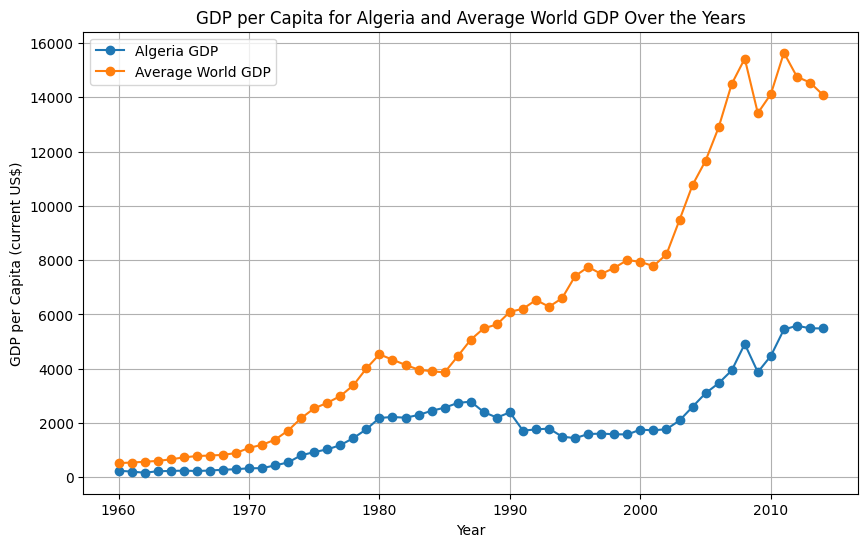

In [21]:
#let's visualize it
combined_data = pd.merge(algeria_gdp_over_years, world_gdp_over_years, on='Year', how='inner')

import matplotlib.pyplot as plt
# Create a line plot for Algeria and the average world GDP
plt.figure(figsize=(10, 6))
plt.plot(combined_data['Year'], combined_data['Algeria GDP'], label='Algeria GDP', marker='o', linestyle='-')
plt.plot(combined_data['Year'], combined_data['Average World GDP'], label='Average World GDP', marker='o', linestyle='-')
plt.title('GDP per Capita for Algeria and Average World GDP Over the Years')
plt.xlabel('Year')
plt.ylabel('GDP per Capita (current US$)')
plt.legend()
plt.grid(True)
plt.show()



In [22]:
combined_data

,Year,Algeria GDP,Average World GDP
0,1960,244.823735,524.553561
1,1961,213.485048,547.067415
2,1962,171.209137,573.765485
3,1963,225.529803,607.754405
4,1964,236.609182,661.874226
5,1965,248.380142,736.685908
6,1966,234.190775,784.977507
7,1967,252.420303,804.875182
8,1968,280.270647,827.872383
9,1969,300.984293,895.840289


In [23]:
import plotly.express as px
# Create an interactive line plot
fig = px.line(combined_data, x='Year', y=['Algeria GDP', 'Average World GDP'],
              labels={'Value': 'GDP per Capita (current US$)'},
              title='GDP per Capita for Algeria and Average World GDP Over the Years')

# Show the plot
fig.show()

In [24]:
# Selecting the Import index  for Algeria
algeria_import_over_years=pd.read_sql(""" SELECT Year,Value AS 'Import index'
                FROM Indicators
                WHERE IndicatorName ='Import volume index (2000 = 100)'
                AND CountryName = "Algeria" """,
           conn)
algeria_import_over_years

,Year,Import index
0,1980,145.264893
1,1981,170.618532
2,1982,166.969429
3,1983,179.397339
4,1984,153.169772
5,1985,148.549675
6,1986,113.969825
7,1987,74.305980
8,1988,77.386918
9,1989,93.566905


In [25]:
combined_data

,Year,Algeria GDP,Average World GDP
0,1960,244.823735,524.553561
1,1961,213.485048,547.067415
2,1962,171.209137,573.765485
3,1963,225.529803,607.754405
4,1964,236.609182,661.874226
5,1965,248.380142,736.685908
6,1966,234.190775,784.977507
7,1967,252.420303,804.875182
8,1968,280.270647,827.872383
9,1969,300.984293,895.840289


In [26]:
combined_data = pd.merge(algeria_gdp_over_years, algeria_import_over_years, on='Year', how='inner')
# Create an interactive line plot
fig = px.line(combined_data, x='Year', y=['Algeria GDP', 'Import index'],
              labels={'Value': 'GDP per Capita (current US$)'},
              title='GDP per Capita for Algeria and Average World GDP Over the Years')

# Show the plot
fig.show()

In [27]:
# Selecting the Import index  for Algeria
indicators_to_select = [
    'Wage and salaried workers, female (% of females employed)',
    'Wage and salaried workers, total (% of total employed)',
    'Wage and salary workers, male (% of males employed)'
]
indicator_names = ','.join([f"'{indicator}'" for indicator in indicators_to_select])
gender=pd.read_sql(f"""
SELECT Year, Value, IndicatorName
FROM Indicators
WHERE CountryName = "Algeria"
  AND IndicatorName IN ({indicator_names})
""", conn)
gender

,Year,Value,IndicatorName
0,2001,57.700001,"Wage and salaried workers, female (% of female..."
1,2001,60.900002,"Wage and salaried workers, total (% of total e..."
2,2001,61.400002,"Wage and salary workers, male (% of males empl..."
3,2003,65.800003,"Wage and salaried workers, female (% of female..."
4,2003,64.800003,"Wage and salaried workers, total (% of total e..."
5,2003,64.599998,"Wage and salary workers, male (% of males empl..."
6,2004,49.799999,"Wage and salaried workers, female (% of female..."
7,2004,59.799999,"Wage and salaried workers, total (% of total e..."
8,2004,61.900002,"Wage and salary workers, male (% of males empl..."
9,2005,51.099998,"Wage and salaried workers, female (% of female..."


In [28]:
data_pivoted = gender.pivot(index='Year', columns='IndicatorName', values='Value').reset_index()
data_pivoted

IndicatorName,Year,"Wage and salaried workers, female (% of females employed)","Wage and salaried workers, total (% of total employed)","Wage and salary workers, male (% of males employed)"
0,2001,57.700001,60.900002,61.400002
1,2003,65.800003,64.800003,64.599998
2,2004,49.799999,59.799999,61.900002
3,2005,51.099998,38.200001,36.000000
4,2008,39.799999,35.000000,34.099998
5,2009,39.200001,33.099998,32.000000
6,2010,35.900002,33.000000,32.400002
7,2011,74.400002,67.000000,65.599998
8,2013,73.699997,69.000000,67.900002
9,2014,77.400002,70.900002,69.599998


In [29]:
import plotly.express as px

# Assuming 'data_pivoted' contains the data in the desired format

# Create a line plot with Plotly Express
fig = px.line(data_pivoted, x='Year', y=data_pivoted.columns[1:], title="Gross Enrolment Ratios Over the Years (Algeria)")

# Customize the axis labels and legend
fig.update_xaxes(title_text="Year")
fig.update_yaxes(title_text="Value")
fig.update_layout(legend_title_text="Indicators")

# Show the interactive plot
fig.show()


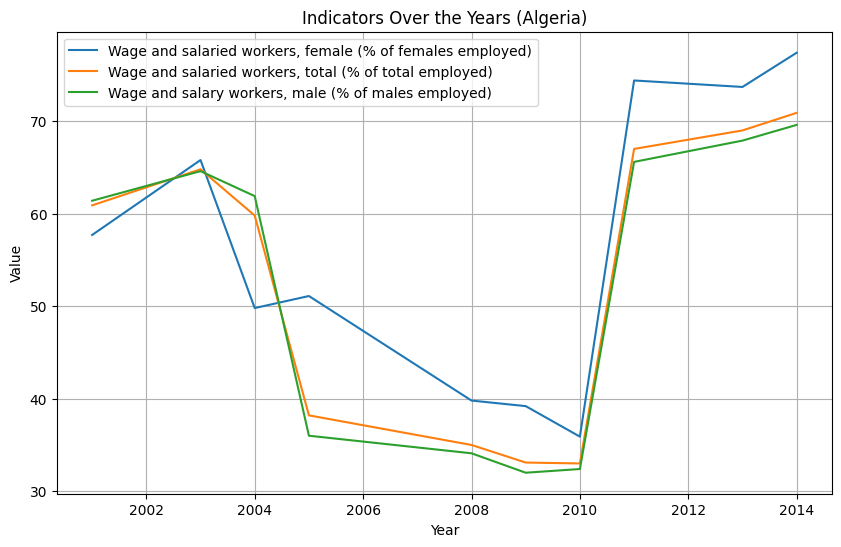

In [30]:
import matplotlib.pyplot as plt

# Assuming 'data_pivoted' contains the data you want to plot

# Create a single static line plot with all indicators
plt.figure(figsize=(10, 6))  # Set the figure size

for column in data_pivoted.columns[1:]:
    plt.plot(data_pivoted['Year'], data_pivoted[column], label=column)

plt.title("Indicators Over the Years (Algeria)")
plt.xlabel("Year")
plt.ylabel("Value")
plt.grid(True)
plt.legend()
plt.show()


In [31]:
# Selecting the Import index  for Algeria
indicators_to_select = [
    'Contributing family workers, female (% of females employed)',
    'Contributing family workers, male (% of males employed)'
]
indicator_names = ','.join([f"'{indicator}'" for indicator in indicators_to_select])
gender=pd.read_sql(f"""
SELECT Year, Value, IndicatorName
FROM Indicators
WHERE CountryName = "Algeria"
  AND IndicatorName IN ({indicator_names})
""", conn)
gender
data_pivoted = gender.pivot(index='Year', columns='IndicatorName', values='Value').reset_index()
data_pivoted

IndicatorName,Year,"Contributing family workers, female (% of females employed)","Contributing family workers, male (% of males employed)"
0,2001,6.1,8.8
1,2003,7.2,7.2
2,2004,13.6,7.1
3,2005,7.3,7.2
4,2008,8.0,4.7
5,2009,5.3,4.9
6,2010,8.5,3.4
7,2011,2.2,2.1
8,2013,2.9,2.0
9,2014,1.6,1.6


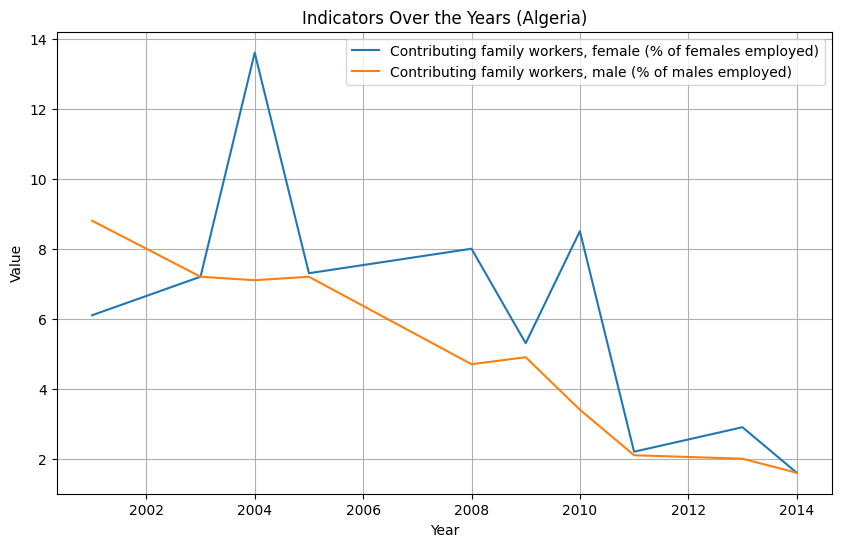

In [32]:
import matplotlib.pyplot as plt

# Assuming 'data_pivoted' contains the data you want to plot

# Create a single static line plot with all indicators
plt.figure(figsize=(10, 6))  # Set the figure size

for column in data_pivoted.columns[1:]:
    plt.plot(data_pivoted['Year'], data_pivoted[column], label=column)

plt.title("Indicators Over the Years (Algeria)")
plt.xlabel("Year")
plt.ylabel("Value")
plt.grid(True)
plt.legend()
plt.show()

In [33]:
# Selecting the Import index  for Algeria
indicators_to_select = [
    'Food exports (% of merchandise exports)',
    'Food imports (% of merchandise imports)',
    'Agricultural machinery, tractors per 100 sq. km of arable land',
'Food production index (2004-2006 = 100)',
'Fuel exports (% of merchandise exports)']
indicator_names = ','.join([f"'{indicator}'" for indicator in indicators_to_select])
gender=pd.read_sql(f"""
SELECT Year, Value, IndicatorName
FROM Indicators
WHERE CountryName = "Algeria"
  AND IndicatorName IN ({indicator_names})
""", conn)
gender
data_pivoted = gender.pivot(index='Year', columns='IndicatorName', values='Value').reset_index()
#data_pivoted = data_pivoted.fillna(0)

data_pivoted

IndicatorName,Year,"Agricultural machinery, tractors per 100 sq. km of arable land",Food exports (% of merchandise exports),Food imports (% of merchandise imports),Food production index (2004-2006 = 100),Fuel exports (% of merchandise exports)
0,1961,41.718171,NaN,NaN,38.27,NaN
1,1962,43.333333,NaN,NaN,39.81,NaN
2,1963,44.354839,NaN,NaN,39.83,NaN
3,1964,45.662100,NaN,NaN,35.51,NaN
4,1965,45.623086,NaN,NaN,41.23,NaN
5,1966,48.223758,30.969605,25.778365,27.61,59.292765
6,1967,62.688462,NaN,NaN,30.32,NaN
7,1968,63.751402,16.090813,19.298547,38.99,70.979965
8,1969,64.174555,20.547007,15.714729,35.98,67.618006
9,1970,64.340589,19.983275,12.737320,37.35,70.236468


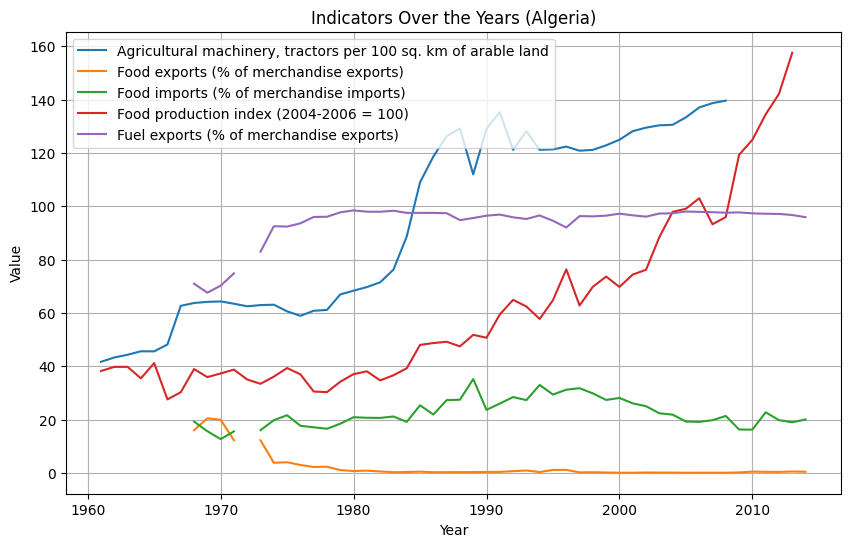

In [34]:
import matplotlib.pyplot as plt

# Assuming 'data_pivoted' contains the data you want to plot

# Create a single static line plot with all indicators
plt.figure(figsize=(10, 6))  # Set the figure size

for column in data_pivoted.columns[1:]:
    plt.plot(data_pivoted['Year'], data_pivoted[column], label=column)

plt.title("Indicators Over the Years (Algeria)")
plt.xlabel("Year")
plt.ylabel("Value")
plt.grid(True)
plt.legend()
plt.show()

In [35]:
# Selecting the Import index  for Algeria
indicators_to_select = [
    'Annual freshwater withdrawals, agriculture (% of total freshwater withdrawal)',
    'Annual freshwater withdrawals, domestic (% of total freshwater withdrawal)',
    'Annual freshwater withdrawals, industry (% of total freshwater withdrawal)',
'Annual freshwater withdrawals, total (% of internal resources)',
'Annual freshwater withdrawals, total (billion cubic meters)']
indicator_names = ','.join([f"'{indicator}'" for indicator in indicators_to_select])
gender=pd.read_sql(f"""
SELECT Year, Value, IndicatorName
FROM Indicators
WHERE CountryName = "Algeria"
  AND IndicatorName IN ({indicator_names})
""", conn)
gender
data_pivoted = gender.pivot(index='Year', columns='IndicatorName', values='Value').reset_index()
#data_pivoted = data_pivoted.fillna(0)

data_pivoted

IndicatorName,Year,"Annual freshwater withdrawals, agriculture (% of total freshwater withdrawal)","Annual freshwater withdrawals, domestic (% of total freshwater withdrawal)","Annual freshwater withdrawals, industry (% of total freshwater withdrawal)","Annual freshwater withdrawals, total (% of internal resources)","Annual freshwater withdrawals, total (billion cubic meters)"
0,1972,NaN,NaN,NaN,17.777778,2.000
1,1977,NaN,NaN,NaN,22.222222,2.500
2,1982,74.00,22.00,4.00,26.666667,3.000
3,1987,NaN,NaN,NaN,31.111111,3.500
4,1992,60.00,24.89,15.11,40.000000,4.500
5,2002,61.19,24.24,14.58,50.871111,5.723
6,2013,61.19,24.24,14.58,50.871111,5.723


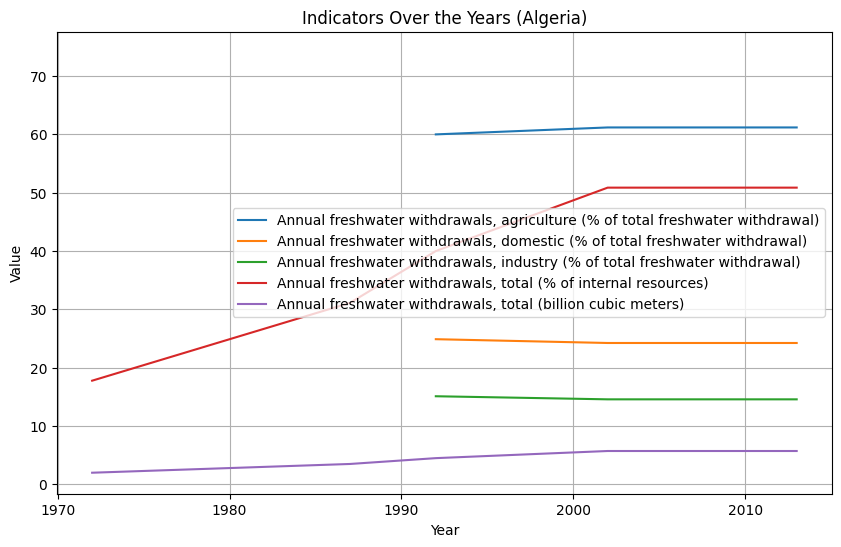

In [36]:
import matplotlib.pyplot as plt

# Assuming 'data_pivoted' contains the data you want to plot

# Create a single static line plot with all indicators
plt.figure(figsize=(10, 6))  # Set the figure size

for column in data_pivoted.columns[1:]:
    plt.plot(data_pivoted['Year'], data_pivoted[column], label=column)

plt.title("Indicators Over the Years (Algeria)")
plt.xlabel("Year")
plt.ylabel("Value")
plt.grid(True)
plt.legend()
plt.show()

In [37]:
# Selecting the Import index  for Algeria
indicators_to_select = [
    'Unemployment, female (% of female labor force) (national estimate)',
    'Unemployment, male (% of male labor force) (national estimate)']
indicator_names = ','.join([f"'{indicator}'" for indicator in indicators_to_select])
gender=pd.read_sql(f"""
SELECT Year, Value, IndicatorName
FROM Indicators
WHERE CountryName = "Algeria"
  AND IndicatorName IN ({indicator_names})
""", conn)
gender
data_pivoted = gender.pivot(index='Year', columns='IndicatorName', values='Value').reset_index()
#data_pivoted = data_pivoted.fillna(0)

data_pivoted

IndicatorName,Year,"Unemployment, female (% of female labor force) (national estimate)","Unemployment, male (% of male labor force) (national estimate)"
0,1989,15.900000,17.200001
1,1991,17.000000,21.700001
2,1992,20.299999,24.200001
3,1995,38.400002,26.000000
4,1997,26.200001,25.299999
5,2000,29.700001,29.799999
6,2003,25.400000,23.400000
7,2004,21.299999,19.799999
8,2005,17.500000,14.900000
9,2006,14.400000,11.800000


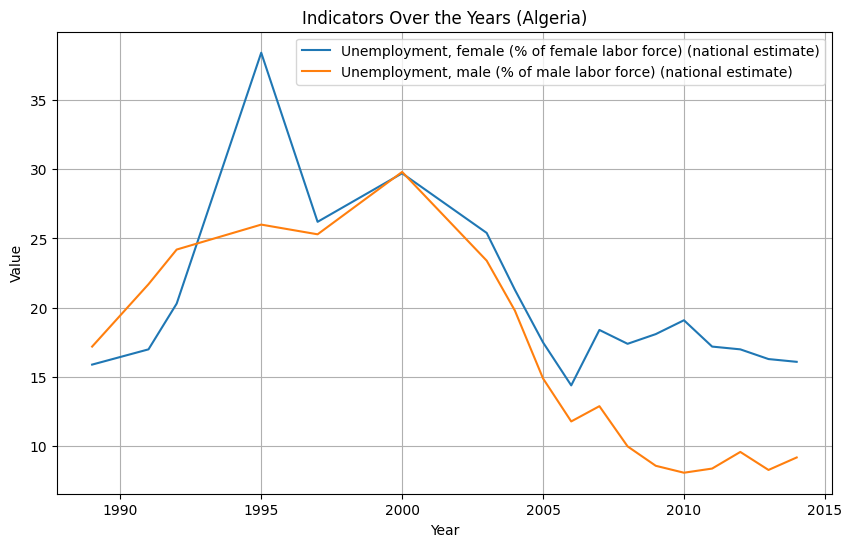

In [38]:
import matplotlib.pyplot as plt

# Assuming 'data_pivoted' contains the data you want to plot

# Create a single static line plot with all indicators
plt.figure(figsize=(10, 6))  # Set the figure size

for column in data_pivoted.columns[1:]:
    plt.plot(data_pivoted['Year'], data_pivoted[column], label=column)

plt.title("Indicators Over the Years (Algeria)")
plt.xlabel("Year")
plt.ylabel("Value")
plt.grid(True)
plt.legend()
plt.show()

In [39]:
# Selecting the Import index  for Algeria
indicators_to_select = [
    'Unemployment with tertiary education, female (% of female unemployment)',
    'Unemployment with tertiary education, male (% of male unemployment)']
indicator_names = ','.join([f"'{indicator}'" for indicator in indicators_to_select])
gender=pd.read_sql(f"""
SELECT Year, Value, IndicatorName
FROM Indicators
WHERE CountryName = "Algeria"
  AND IndicatorName IN ({indicator_names})
""", conn)
gender
data_pivoted = gender.pivot(index='Year', columns='IndicatorName', values='Value').reset_index()
#data_pivoted = data_pivoted.fillna(0)

data_pivoted

IndicatorName,Year,"Unemployment with tertiary education, female (% of female unemployment)","Unemployment with tertiary education, male (% of male unemployment)"
0,2001,26.799999,5.6
1,2003,30.100000,5.8
2,2004,33.000000,6.6
3,2008,46.799999,10.5
4,2011,51.900002,10.6


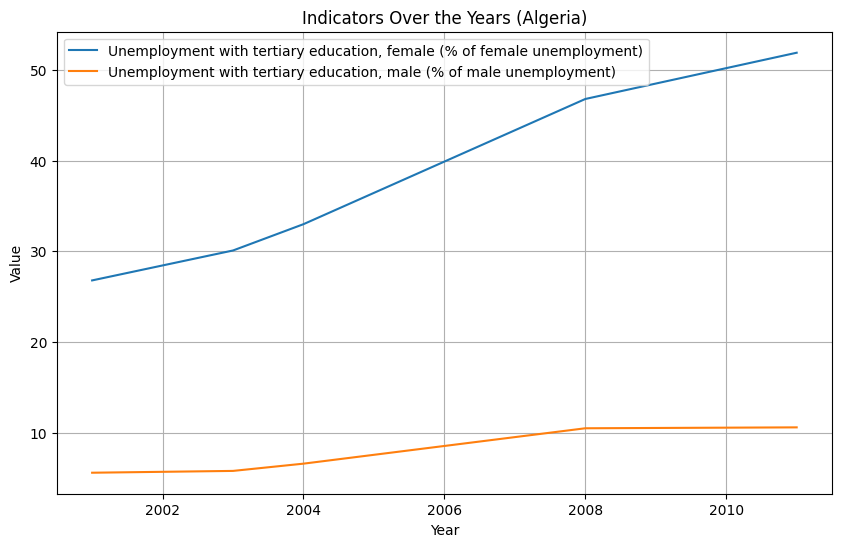

In [40]:
import matplotlib.pyplot as plt

# Assuming 'data_pivoted' contains the data you want to plot

# Create a single static line plot with all indicators
plt.figure(figsize=(10, 6))  # Set the figure size

for column in data_pivoted.columns[1:]:
    plt.plot(data_pivoted['Year'], data_pivoted[column], label=column)

plt.title("Indicators Over the Years (Algeria)")
plt.xlabel("Year")
plt.ylabel("Value")
plt.grid(True)
plt.legend()
plt.show()